In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression

from sklearn.preprocessing import StandardScaler

In [2]:
train_data = pd.read_csv("input/loan.csv")
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 614 entries, 0 to 613
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Loan_ID            614 non-null    object 
 1   Gender             601 non-null    object 
 2   Married            611 non-null    object 
 3   Dependents         599 non-null    object 
 4   Education          614 non-null    object 
 5   Self_Employed      582 non-null    object 
 6   ApplicantIncome    614 non-null    int64  
 7   CoapplicantIncome  614 non-null    float64
 8   LoanAmount         592 non-null    float64
 9   Loan_Amount_Term   600 non-null    float64
 10  Credit_History     564 non-null    float64
 11  Property_Area      614 non-null    object 
 12  Loan_Status        614 non-null    object 
dtypes: float64(4), int64(1), object(8)
memory usage: 62.5+ KB


In [3]:
#Drop data
train= train_data.drop(columns=['Loan_ID'])

In [4]:
train.isnull().sum()

Gender               13
Married               3
Dependents           15
Education             0
Self_Employed        32
ApplicantIncome       0
CoapplicantIncome     0
LoanAmount           22
Loan_Amount_Term     14
Credit_History       50
Property_Area         0
Loan_Status           0
dtype: int64

In [5]:
train_df=train.dropna(how='any')
train_df

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
1,Male,Yes,1,Graduate,No,4583,1508.0,128.0,360.0,1.0,Rural,N
2,Male,Yes,0,Graduate,Yes,3000,0.0,66.0,360.0,1.0,Urban,Y
3,Male,Yes,0,Not Graduate,No,2583,2358.0,120.0,360.0,1.0,Urban,Y
4,Male,No,0,Graduate,No,6000,0.0,141.0,360.0,1.0,Urban,Y
5,Male,Yes,2,Graduate,Yes,5417,4196.0,267.0,360.0,1.0,Urban,Y
...,...,...,...,...,...,...,...,...,...,...,...,...
609,Female,No,0,Graduate,No,2900,0.0,71.0,360.0,1.0,Rural,Y
610,Male,Yes,3+,Graduate,No,4106,0.0,40.0,180.0,1.0,Rural,Y
611,Male,Yes,1,Graduate,No,8072,240.0,253.0,360.0,1.0,Urban,Y
612,Male,Yes,2,Graduate,No,7583,0.0,187.0,360.0,1.0,Urban,Y


In [6]:
#replace 3+ value in Dependents
train_df['Dependents'] = train_df['Dependents'].replace(['3+'], '3')
#df['column name'] = df['column name'].replace(['old value'],'new value')

<ipython-input-6-74a58eab729a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['Dependents'] = train_df['Dependents'].replace(['3+'], '3')


In [7]:
train_df.to_csv('updated_csv.csv', index=False)

In [8]:
#sET x AND Y
X=train_df.drop("Loan_Status", axis=1)
y_df= train_df['Loan_Status']

y_df

1      N
2      Y
3      Y
4      Y
5      Y
      ..
609    Y
610    Y
611    Y
612    Y
613    N
Name: Loan_Status, Length: 480, dtype: object

In [9]:
#Change 'Dependents' column to numerical value
X["Dependents"] = X["Dependents"].astype(float)

In [10]:
#Use Dummy Encoding to transform each categorical feature into new columns 
X_dummies= pd.get_dummies(X[["Gender", "Married", "Education",'Self_Employed']])
#Drop duplicate columns

data_1= X_dummies.drop(columns=['Gender_Female','Married_No','Education_Graduate','Self_Employed_No'])
X_dummies

,Gender_Female,Gender_Male,Married_No,Married_Yes,Education_Graduate,Education_Not Graduate,Self_Employed_No,Self_Employed_Yes
1,0,1,0,1,1,0,1,0
2,0,1,0,1,1,0,0,1
3,0,1,0,1,0,1,1,0
4,0,1,1,0,1,0,1,0
5,0,1,0,1,1,0,0,1
...,...,...,...,...,...,...,...,...
609,1,0,1,0,1,0,1,0
610,0,1,0,1,1,0,1,0
611,0,1,0,1,1,0,1,0
612,0,1,0,1,1,0,1,0


In [11]:
#Replace string value in property Area to numerical values
X['Property_Area'] = X['Property_Area'].replace(to_replace=['Semiurban'], 
                                              value= 0, regex= True)
X['Property_Area'] = X['Property_Area'].replace(to_replace=['Urban'], 
                                              value= 1, regex= True)
X['Property_Area'] = X['Property_Area'].replace(to_replace=['Rural'], 
                                              value= 2, regex= True)
X['Property_Area'].value_counts()


0    191
1    150
2    139
Name: Property_Area, dtype: int64

In [18]:
#Concat 
X_df= pd.concat([X, data_1], axis=1)
#drop duplicate columns
X_df= X_df.drop(columns=['Gender','Married','Education','Self_Employed'])

X_df["Dependents"] = X_df["Dependents"].astype(float)
feature_names = X_df.columns

X_df['UserIncome']= X_df["ApplicantIncome"]+X_df["CoapplicantIncome"]
X_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 480 entries, 1 to 613
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Dependents              480 non-null    float64
 1   ApplicantIncome         480 non-null    int64  
 2   CoapplicantIncome       480 non-null    float64
 3   LoanAmount              480 non-null    float64
 4   Loan_Amount_Term        480 non-null    float64
 5   Credit_History          480 non-null    float64
 6   Property_Area           480 non-null    int64  
 7   Gender_Male             480 non-null    uint8  
 8   Married_Yes             480 non-null    uint8  
 9   Education_Not Graduate  480 non-null    uint8  
 10  Self_Employed_Yes       480 non-null    uint8  
 11  UserIncome              480 non-null    float64
dtypes: float64(6), int64(2), uint8(4)
memory usage: 35.6 KB


In [24]:
X_df= X_df.drop(columns= ['UserIncome'])

In [25]:
#use get_dummies on y to convert it to numerical values
y= pd.get_dummies(y_df)
y= y.drop(columns=['N'])
y= y.values.reshape(-1, 1)
target_names = ["Yes", "No"]

In [26]:
#Split data into training and testing data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_df, y, random_state=42)

In [27]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScater model and fit it to the training data
X_scaler = StandardScaler().fit(X_train)

# Transform the training and testing data using the X_scaler
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

In [28]:
#create random forest model
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=200)
rf = rf.fit(X_train_scaled, y_train)
rf.score(X_test_scaled, y_test)

<ipython-input-28-139678872de4>:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf = rf.fit(X_train_scaled, y_train)


0.7916666666666666

In [29]:
#Look at column that affect model result
sorted(zip(rf.feature_importances_, feature_names), reverse=True)

[(0.25242054168899364, 'Credit_History'),
 (0.19947074861627534, 'ApplicantIncome'),
 (0.1977342878360119, 'LoanAmount'),
 (0.11210638567074403, 'CoapplicantIncome'),
 (0.051520010300120045, 'Dependents'),
 (0.05108156237975713, 'Loan_Amount_Term'),
 (0.04746328461658862, 'Property_Area'),
 (0.025847126593946532, 'Married_Yes'),
 (0.021912771743603145, 'Education_Not Graduate'),
 (0.021007223433772634, 'Gender_Male'),
 (0.019436057120186978, 'Self_Employed_Yes')]

In [30]:
# check Important features
feature_importances_df = pd.DataFrame(
    {"feature": feature_names, "importance": rf.feature_importances_}
).sort_values("importance", ascending=False)

# Display
feature_importances_df

,feature,importance
5,Credit_History,0.252421
1,ApplicantIncome,0.199471
3,LoanAmount,0.197734
2,CoapplicantIncome,0.112106
0,Dependents,0.051520
4,Loan_Amount_Term,0.051082
6,Property_Area,0.047463
8,Married_Yes,0.025847
9,Education_Not Graduate,0.021913
7,Gender_Male,0.021007


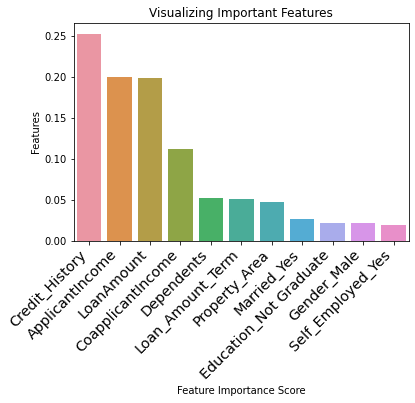

In [31]:
# visualize important featuers
import seaborn as sns
# Creating a bar plot
sns.barplot(x=feature_importances_df.feature, y=feature_importances_df.importance)
# Add labels to your

plt.xlabel("Feature Importance Score")
plt.ylabel("Features")
plt.title("Visualizing Important Features")
plt.xticks(
    rotation=45, horizontalalignment="right", fontweight="light", fontsize="x-large"
)
plt.savefig("../final/Important_features.png")
plt.show()

In [20]:
# Calculate classification report
predictions= rf.predict(X_test_scaled)
from sklearn.metrics import classification_report
clf_report=classification_report(y_test, predictions,
                            target_names=["yes", "no"],output_dict=True)

In [23]:
predictions

array([1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1], dtype=uint8)

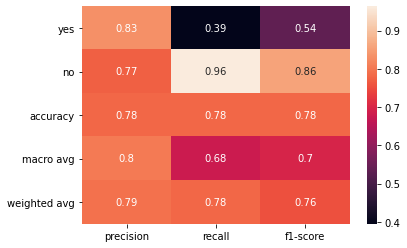

In [21]:
sns.heatmap(pd.DataFrame(clf_report).iloc[:-1, :].T, annot=True)
plt.savefig("../final/heatmap.png")

In [22]:
# Extract single tree
estimator = rf.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = feature_names,
                class_names = target_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [67]:
# Save the model

import pickle

filename = 'finalized_model.sav'

pickle.dump(rf, open(filename, 'wb'))
 
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))
result = loaded_model.predict(X_test_scaled, y_test)
print(result)

0.7833333333333333
